# Set-up

In [1]:
# Import Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from numpy import loadtxt
import os, glob
import geopandas as gpd
import geojsonio
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual
import math
from IPython.display import Image
from pandas_profiling import ProfileReport

# Plotly
import plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import cufflinks as cf

import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.subplots import make_subplots
init_notebook_mode(connected=True)
cf.go_offline()
%matplotlib inline
#pd.options.plotting.backend = "plotly"

In [2]:
# Dashboard (Global Variables)
target = "price"
figcount = 0
figpath = "figures_clean/"

# Table Display Settings
pd.set_option('display.max_columns', 150)
pd.set_option('display.max_rows', 100)
pd.options.display.max_seq_items = 300
pd.set_option('display.max_colwidth', 150)

#Plotting Settings
sns.set(style="white")  #, palette=["#FF5A5F", "#00A699"])
sns.set_palette(sns.color_palette(["#767676", "#FF5A5F", "#00A699"]))

pio.templates.default = "simple_white"
px.defaults.template = "simple_white"  # 'ggplot2', 'seaborn', 'simple_white', 'plotly', 'plotly_white', 'plotly_dark', 'presentation', 'xgridoff', 'ygridoff', 'gridon', 'none'
px.defaults.color_continuous_scale = [
    "#B6B6B6", "#767676", "#FF9A7F", "#FF5A5F"
]  # ["#50D6B9", "#00A699", "#FF9A7F", "#FF5A5F"] #"burgyl"
px.defaults.color_discrete_sequence = ["#767676", "#FF5A5F", "#00A699"]
px.defaults.width = 900
px.defaults.height = 600

In [3]:
# Import data_clean
data = pd.read_pickle("saves/data_clean.pkl")

In [4]:
# Create path to save figures (if not existing)
if not os.path.exists(figpath):
    os.mkdir(figpath)

In [5]:
# Delete all saved plots (caution!)
del_files = glob.glob(f'{figpath}*')
for f in del_files:
    os.remove(f)

In [6]:
# Function for saving plots with continuous number
def savefig(fig=None, title="Untitled", library="py"):
    global figcount
    global figpath
    existing = False
    filesave = ""
    save_files = glob.glob(f'{figpath}*')
    for f in save_files:
        if title in f:
            existing = True
            filesave = f
    if existing == True:
        if library == "py":
            fig.write_image(filesave)
        elif library == "plt":
            plt.savefig(filesave)
        else:
            print("Please enter valid library ('py', 'plt')")
    else:
        figcount += 1
        if library == "py":
            fig.write_image(f"{figpath}fig{figcount:02d}_{title}.png")
        elif library == "plt":
            plt.savefig(f"{figpath}fig{figcount:02d}_{title}.png")
        else:
            print("Please enter valid library ('py', 'plt')")
            figcount -= 1

# Data Exploration

In [7]:
# Display available columns from "data"
data.columns

Index(['accommodates', 'am_balcony', 'am_breakfast', 'am_child_friendly',
       'am_coffee_machine', 'am_cooking_basics', 'am_elevator',
       'am_essentials', 'am_nature_and_views', 'am_parking', 'am_pets_allowed',
       'am_private_entrance', 'am_smoking_allowed', 'am_tv', 'am_white_goods',
       'amenities', 'availability_365', 'availability_90', 'bathrooms',
       'bedrooms', 'beds', 'calculated_host_listings_count',
       'cancellation_policy', 'cleaning_fee', 'description', 'extra_people',
       'first_review', 'guests_included', 'host_identity_verified',
       'host_is_superhost', 'house_rules', 'instant_bookable', 'interaction',
       'is_location_exact', 'last_review', 'latitude', 'longitude',
       'maximum_nights', 'minimum_nights', 'monthly_price', 'name',
       'neighborhood_overview', 'neighbourhood_cleansed', 'notes', 'price',
       'property_type', 'review_scores_rating', 'room_type',
       'security_deposit', 'space', 'summary', 'transit', 'weekly_price',


In [8]:
# Define "reduced_features"
reduced_features = [
    "accommodates",
    "availability_365",
    #                   "availability_90",
    #                   "bathrooms",
    #                   "bedrooms",
    #                   "beds",
    "calculated_host_listings_count",
    "extra_people",
    #                   "guests_included",
    #                   "maximum_nights",
    "minimum_nights",
    "price",
    "review_scores_rating"
]

In [9]:
# Define "key_features"
key_features = [
    "accommodates",
    #                   "availability_365",
    #                   "availability_90",
    #                   "bathrooms",
    #                   "bedrooms",
    #                   "beds",
    "calculated_host_listings_count",
    #                   "extra_people",
    #                   "guests_included",
    #                   "maximum_nights",
    #                   "minimum_nights",
    "price",
    "review_scores_rating",
    "host_is_superhost"
]

In [10]:
# Separate/create variables for numerical and categorical features
num_features = list(data.columns[data.dtypes != object])
cat_features = list(data.columns[data.dtypes == object])
#data_cont = data[num_features]

## Interactive Dashboards

In [11]:
# Display figures from graphical exploration below direcly here in the dashboard
@interact_manual
def show_images(file=sorted(os.listdir(figpath))):
    display(Image(figpath + file))

interactive(children=(Dropdown(description='file', options=(), value=None), Button(description='Run Interact',…

In [12]:
# Display table with all rows where feature value is > x (where x is the selected threshold)
@interact(x=widgets.IntSlider(1, 0, 100, 1, continuous_update=False))
def filter_data(column=num_features, x=10):
    return data.loc[data[column] > x]

interactive(children=(Dropdown(description='column', options=('accommodates', 'am_balcony', 'am_breakfast', 'a…

In [13]:
# Display interactive plot for comparing two features
@interact_manual(
    x=widgets.Dropdown(options=list(data.select_dtypes('number').columns),
                       index=0,
                       description="Feature"),
    y=widgets.Dropdown(options=list(data.select_dtypes('number').columns),
                       value=target,
                       description="Target"),
    kind=widgets.Dropdown(
        options=["bar", "box", "bubble", "heatmap", "histogram", "scatter"],
        value="bar",
        description="Plot Type"))
#                 text='title',
#                 theme=widgets.Dropdown(options=list(cf.themes.THEMES.keys()),description="Theme"),
#                 colorscale=widgets.Dropdown(options=list(cf.colors._scales_names.keys()),description="Colorscale"))
def scatter_plot(x, y, kind):  #,theme,colorscale):

    data.iplot(kind=kind,
               x=x,
               y=y,
               mode='markers',
               xTitle=str(x),
               yTitle=str(y),
               title=f'{str(y)} vs {str(x)}')


#        text=title,
#        theme=theme,
#        colorscale=colorscale)

interactive(children=(Dropdown(description='Feature', options=('accommodates', 'am_balcony', 'am_breakfast', '…

## Tables (non-graphical exploration)

In [14]:
#profile = ProfileReport(data, title='Pandas Profiling Report', explorative=True)
#profile.to_widgets()
#profile.to_notebook_iframe()

In [15]:
# Examine shape and head/columns of data
print(data.shape)
data.head(1)

(10635, 54)


,accommodates,am_balcony,am_breakfast,am_child_friendly,am_coffee_machine,am_cooking_basics,am_elevator,am_essentials,am_nature_and_views,am_parking,am_pets_allowed,am_private_entrance,am_smoking_allowed,am_tv,am_white_goods,amenities,availability_365,availability_90,bathrooms,bedrooms,beds,calculated_host_listings_count,cancellation_policy,cleaning_fee,description,extra_people,first_review,guests_included,host_identity_verified,host_is_superhost,house_rules,instant_bookable,interaction,is_location_exact,last_review,latitude,longitude,maximum_nights,minimum_nights,monthly_price,name,neighborhood_overview,neighbourhood_cleansed,notes,price,property_type,review_scores_rating,room_type,security_deposit,space,summary,transit,weekly_price,zipcode
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3176,4,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,"{Internet,Wifi,Kitchen,""Buzzer/wireless intercom"",Heating,""Family/kid friendly"",Washer,""Smoke detector"",""Carbon monoxide detector"",""First aid kit""...",140,0,1.0,1.0,2.0,1,strict_14_with_grace_period,100.0,This beautiful first floor apartment is situated at Kollwitzplatz. Its ideal for 2 but can comfortably accommodate 4 with the extra double bed i...,20.0,2009-06-20,2,t,f,"It’s a non smoking flat, which likes to be treated with love and respect ;) we don't tolerate parties or pets. Family and kids are more than welco...",f,Feel free to ask any questions prior to booking and during your stay. Once you have booked you will receive via airbnb all relevant information ab...,t,2019-06-27,52.535,13.41758,1125,62,1900.0,Fabulous Flat in great Location,"The neighbourhood is famous for its variety of international eateries, pubs, restaurants, cafés, galleries and little shops. The bakery next door ...",Prenzlauer Berg Südwest,"We welcome FAMILIES and cater especially for young kids. You can make use from our highchair, baby cot and baby bouncer. We also have some trusted...",90.0,Apartment,93.0,Entire home/apt,300.0,1st floor (68m2) apartment on Kollwitzplatz/ Prenzlauer Berg. It's ideal for 2 but can sleep comfortably an extra 2 in the living room. (Please le...,This beautiful first floor apartment is situated at Kollwitzplatz. Its ideal for 2 but can comfortably accommodate 4 with the extra double bed i...,"We are 5 min walk away from the tram M2, which will take you to Alexander Platz- here you can connect to buses, trains and trams that take you an...",520.0,zip_10405


**Outliers**

In [16]:
# Examine illogical column values (e.g. "accommodates" < "guests_included", "bedrooms" > "beds", ...)
data[data.accommodates - data.beds < 0]

,accommodates,am_balcony,am_breakfast,am_child_friendly,am_coffee_machine,am_cooking_basics,am_elevator,am_essentials,am_nature_and_views,am_parking,am_pets_allowed,am_private_entrance,am_smoking_allowed,am_tv,am_white_goods,amenities,availability_365,availability_90,bathrooms,bedrooms,beds,calculated_host_listings_count,cancellation_policy,cleaning_fee,description,extra_people,first_review,guests_included,host_identity_verified,host_is_superhost,house_rules,instant_bookable,interaction,is_location_exact,last_review,latitude,longitude,maximum_nights,minimum_nights,monthly_price,name,neighborhood_overview,neighbourhood_cleansed,notes,price,property_type,review_scores_rating,room_type,security_deposit,space,summary,transit,weekly_price,zipcode
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


**Skew**

In [17]:
# Look at data skew (to check whether scaling with e.g. log makes sense for highly skewed features)
data.skew()

accommodates                      1.551579
am_balcony                        1.026339
am_breakfast                      4.165636
am_child_friendly                 0.877642
am_coffee_machine                 0.015612
am_cooking_basics                -0.348817
am_elevator                       1.184541
am_essentials                    -4.660852
am_nature_and_views               4.827569
am_parking                       -0.438840
am_pets_allowed                   1.724809
am_private_entrance               1.335405
am_smoking_allowed                2.088760
am_tv                            -0.086034
am_white_goods                   -1.696528
availability_365                  0.734965
availability_90                   0.236545
bathrooms                         6.209249
bedrooms                          2.196807
beds                              2.372118
calculated_host_listings_count    5.305702
cleaning_fee                      2.004308
extra_people                      2.508582
guests_incl

Based on skew, log/sqrt shall replace the original feature for:

| **FEATURE** | **METHOD** |
| :----- | :----- |
| **accommodates** | log |
| **bathrooms** | log |
| **minimum_nights** | log |
| **price** | log |
| **review_scores_rating** | sqrt |


**Correlation**

In [18]:
# Interactive feature vs. feature correlation check
@interact
def correlations(column1=list(data.select_dtypes('number').columns),
                 column2=list(data.select_dtypes('number').columns)):
    print(f"Correlation: {data[column1].corr(data[column2])}")

interactive(children=(Dropdown(description='column1', options=('accommodates', 'am_balcony', 'am_breakfast', '…

In [19]:
# Full list of correlation values
data.corr()

,accommodates,am_balcony,am_breakfast,am_child_friendly,am_coffee_machine,am_cooking_basics,am_elevator,am_essentials,am_nature_and_views,am_parking,am_pets_allowed,am_private_entrance,am_smoking_allowed,am_tv,am_white_goods,availability_365,availability_90,bathrooms,bedrooms,beds,calculated_host_listings_count,cleaning_fee,extra_people,guests_included,latitude,longitude,maximum_nights,minimum_nights,monthly_price,price,review_scores_rating,security_deposit,weekly_price
accommodates,1.000000,0.069435,-0.022308,0.315408,0.151316,0.107641,0.059601,-0.041355,0.003474,0.096213,0.082132,0.158405,-0.102366,0.268833,0.038735,0.172587,0.099607,0.220668,0.667398,0.801692,0.228529,0.410336,0.274973,0.598741,0.036359,0.011617,0.118772,-0.055986,0.063441,0.575494,-0.096461,0.084341,0.060329
am_balcony,0.069435,1.000000,-0.010151,0.097212,0.294774,0.406271,0.155394,0.073020,0.104852,0.226500,0.009284,0.038795,0.011389,0.105319,0.145415,-0.047625,-0.034584,0.078491,0.096986,0.028663,-0.090078,0.115893,0.074857,0.080192,0.011666,0.006096,-0.022021,-0.002679,0.033354,0.133430,0.111453,0.079253,0.045461
am_breakfast,-0.022308,-0.010151,1.000000,-0.030109,-0.034718,-0.055575,0.003535,0.029161,0.004642,-0.021478,0.035675,0.001539,0.034204,-0.027185,-0.002812,-0.014802,0.008383,-0.012550,-0.017613,-0.029591,-0.049290,-0.052964,-0.005987,-0.047034,-0.006592,-0.012524,-0.011448,-0.038657,-0.034832,0.019507,0.021350,-0.011300,-0.041726
am_child_friendly,0.315408,0.097212,-0.030109,1.000000,0.133044,0.115182,0.032903,-0.010503,0.012728,0.189924,0.068415,0.019069,-0.081226,0.166973,0.034318,0.171539,0.055353,0.077097,0.261024,0.275333,0.056903,0.215696,0.176911,0.248996,0.006399,0.015647,0.023177,0.029784,0.183895,0.220645,-0.035479,0.064729,0.195617
am_coffee_machine,0.151316,0.294774,-0.034718,0.133044,1.000000,0.549345,0.021497,0.100921,0.069844,0.307557,0.009784,0.093492,-0.037380,0.176432,0.134480,0.079815,0.066758,0.040849,0.104569,0.112231,0.040017,0.172979,0.105141,0.160935,0.022234,-0.014958,-0.003358,-0.010222,0.060925,0.122740,0.081789,0.068944,0.061833
am_cooking_basics,0.107641,0.406271,-0.055575,0.115182,0.549345,1.000000,0.009755,0.134099,0.088482,0.348999,0.022193,0.056628,-0.017315,0.072846,0.214422,-0.010988,-0.002396,0.021174,0.070933,0.068013,-0.118459,0.136559,0.121845,0.119827,0.011713,0.014734,-0.001357,-0.023303,0.047081,0.095300,0.072934,0.064508,0.053295
am_elevator,0.059601,0.155394,0.003535,0.032903,0.021497,0.009755,1.000000,-0.012532,0.033896,0.013677,-0.019882,0.000019,-0.018456,0.150055,0.061064,0.044355,0.050650,0.105575,0.031080,0.016895,0.104308,0.084708,0.029773,0.036625,0.046591,-0.041818,0.032909,0.044659,0.033868,0.201958,-0.010557,0.075760,0.037914
am_essentials,-0.041355,0.073020,0.029161,-0.010503,0.100921,0.134099,-0.012532,1.000000,0.020961,0.106112,0.017342,0.056010,0.016350,-0.016456,0.052385,-0.056466,-0.013343,-0.008309,-0.000625,-0.022027,-0.202864,0.007177,-0.035117,-0.003865,-0.006146,0.009457,0.012824,-0.030740,-0.049690,0.010070,0.073738,0.018703,-0.049196
am_nature_and_views,0.003474,0.104852,0.004642,0.012728,0.069844,0.088482,0.033896,0.020961,1.000000,0.103718,0.028205,0.051907,-0.007454,0.042091,0.003244,0.025951,0.025510,0.023399,0.005833,0.000618,-0.025055,0.016334,0.026134,0.019935,-0.045902,0.004245,0.008673,-0.016642,-0.011459,0.010684,0.013887,0.017106,-0.009559
am_parking,0.096213,0.226500,-0.021478,0.189924,0.307557,0.348999,0.013677,0.106112,0.103718,1.000000,0.039565,0.072272,-0.037721,0.102046,0.046058,0.091152,0.080491,0.024267,0.062168,0.072874,-0.045448,0.087300,0.102438,0.087812,-0.040586,-0.015386,-0.034142,-0.007681,0.052257,0.051161,0.030775,0.047714,0.054697


## Plot visualizations (graphical exploration)

In [20]:
# Histogram of price
fig = px.histogram(
    data,
    x="price",
    title="Price Histogram",
    #             color="host_is_superhost",
    marginal="rug",  # 'rug', 'box', 'violin', 'histogram'
    nbins=50)

fig.show()
savefig(fig, title="histogram_price")

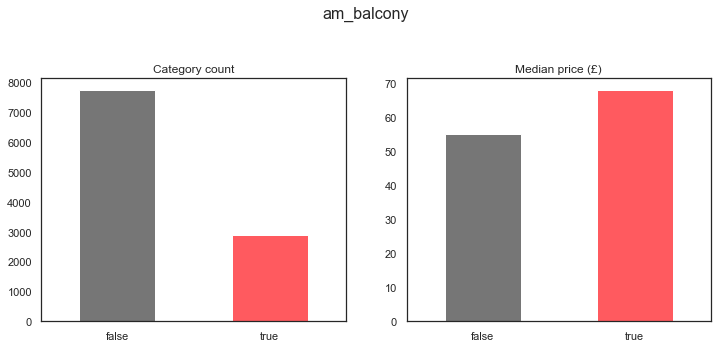

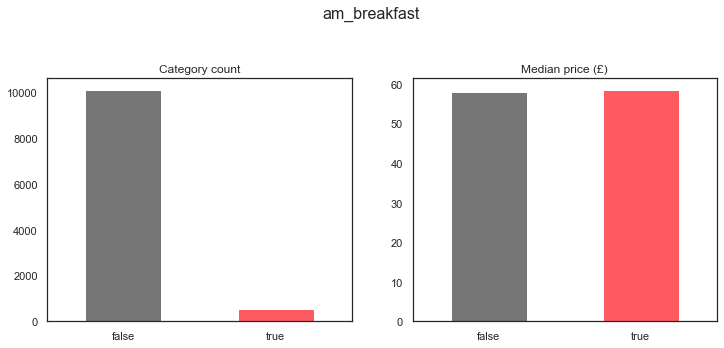

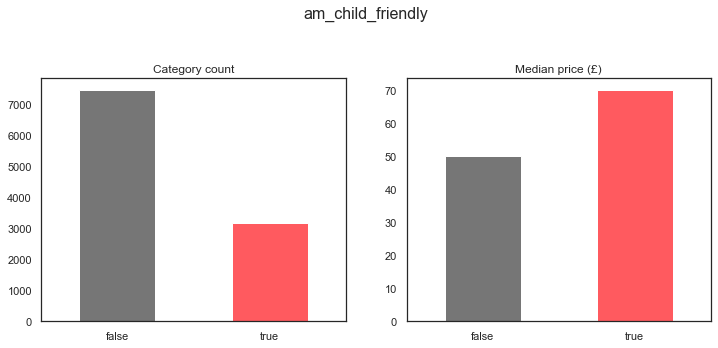

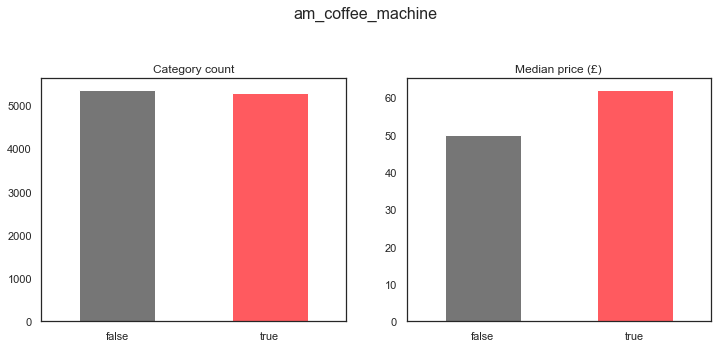

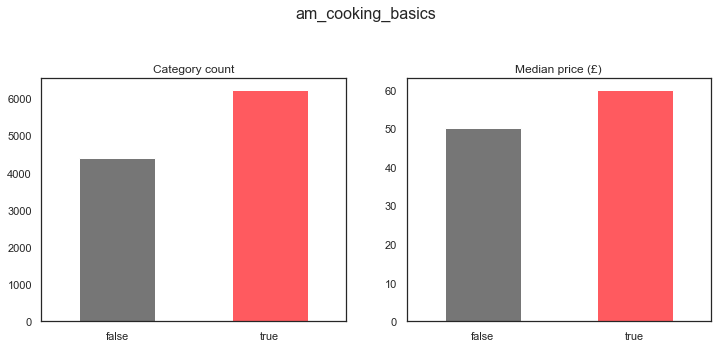

...

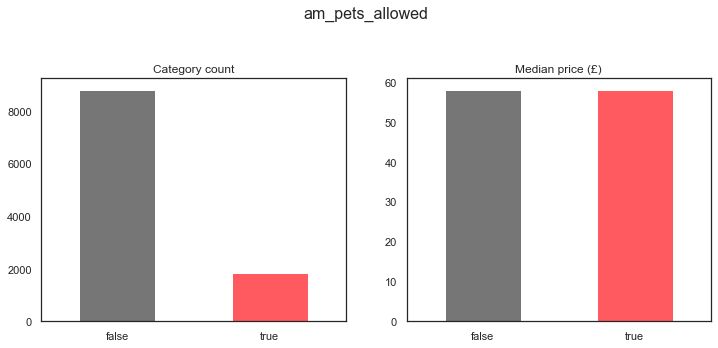

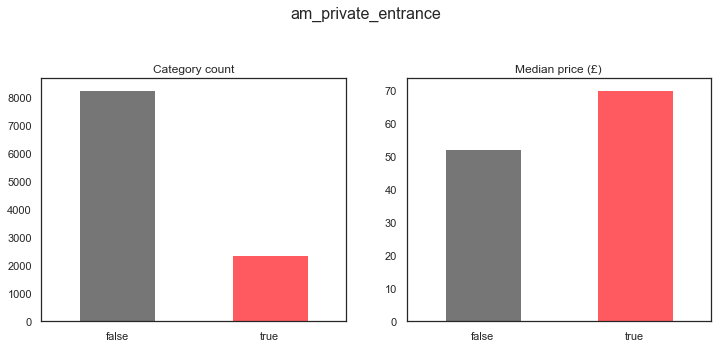

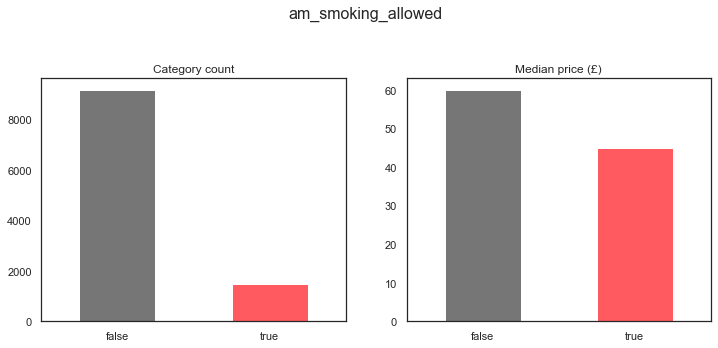

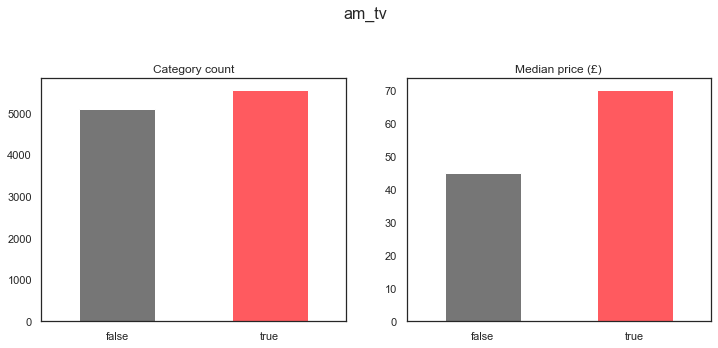

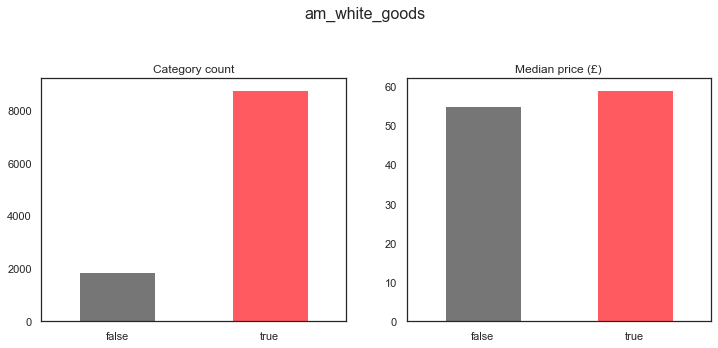

In [21]:
# Count and median price for amenities
am_col = [el for el in data.columns if el.startswith("am_")]

for col in am_col:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(col, fontsize=16, y=1)
    plt.subplots_adjust(
        top=0.80
    )  # So that the suptitle does not overlap with the ax plot titles

    data.groupby(col).size().plot(kind='bar',
                                  ax=ax1,
                                  color=["#767676", "#FF5A5F"])
    ax1.set_xticklabels(labels=['false', 'true'], rotation=0)
    ax1.set_title('Category count')
    ax1.set_xlabel('')

    data.groupby(col).price.median().plot(kind='bar',
                                          ax=ax2,
                                          color=["#767676", "#FF5A5F"])
    ax2.set_xticklabels(labels=['false', 'true'], rotation=0)
    ax2.set_title('Median price (£)')
    ax2.set_xlabel('')

    plt.show()

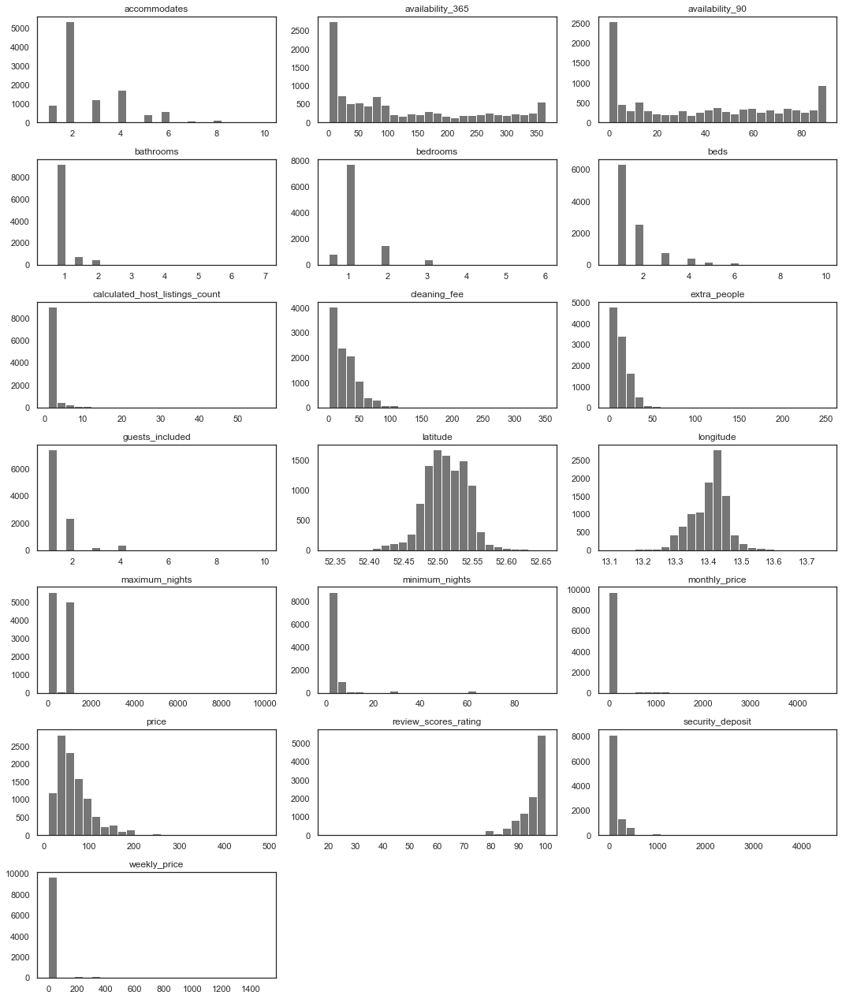

In [23]:
# Histogram of numerical features except amenities
hist_col = [el for el in num_features if el not in am_col]
data[hist_col].hist(figsize=(15, 20),
                    bins=25,
                    layout=(int(len(hist_col) / 3) + 1, 3),
                    grid=False)
plt.tight_layout()
savefig(title="histogram_num_features", library="plt")

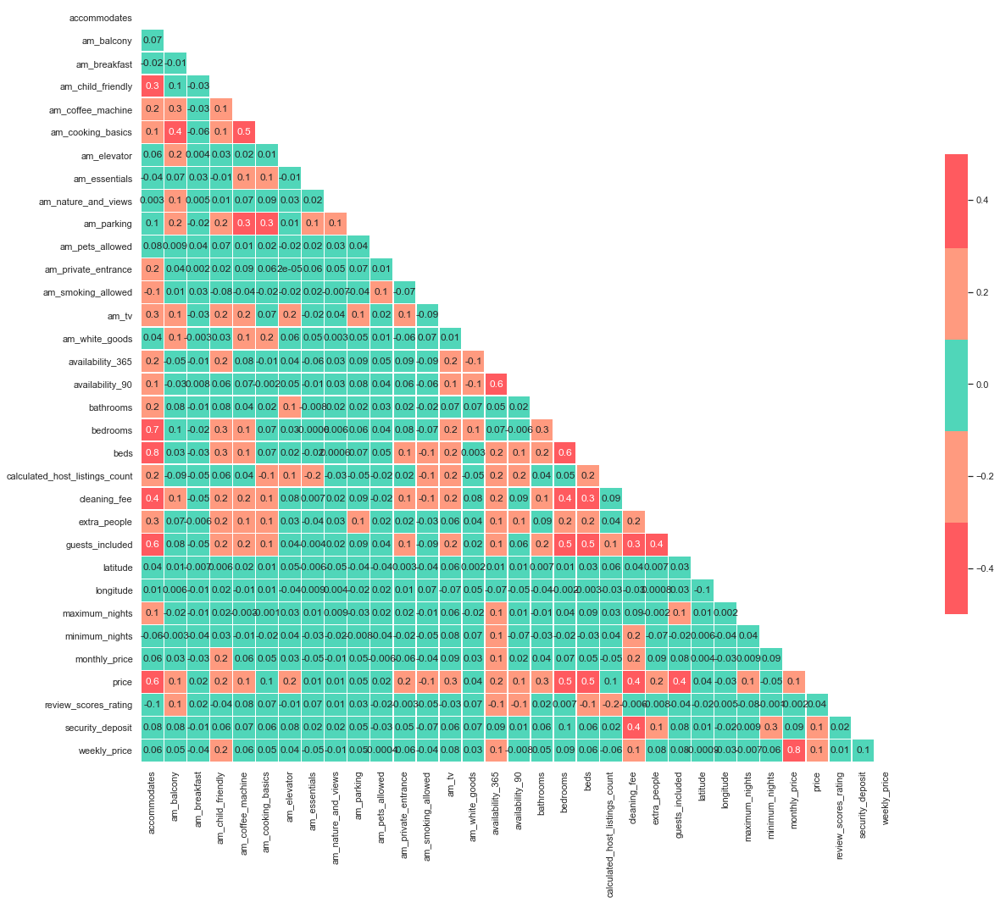

In [24]:
# Correlation heatmap for numerical features (Version 1)
#Generate a mask for the upper triangle
mask = np.triu(np.ones_like(data[num_features].corr(), dtype=np.bool))

#Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 20))

#Generate a custom diverging colormap
#cmap = sns.diverging_palette(220, 10, as_cmap=True)
#cmap = [(0, 166, 153), (255, 90, 95)]

#Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(data[num_features].corr(),
            mask=mask,
            cmap=["#FF5A5F", "#FF9A7F", "#50D6B9", "#FF9A7F", "#FF5A5F"],
            vmax=.5,
            vmin=-.5,
            center=0,
            square=True,
            linewidths=.5,
            cbar_kws={"shrink": .5},
            annot=True,
            fmt=".1g")

savefig(title="full_heatmap", library="plt")

Highly correlated features will be removed from the analysis. For this purpose, the threshold is set at two correlations of 0.4 or above. Hence, the following features are removed:

| **FEATURE** | **REASONING** |
| :----- | :----- |
| **am_cooking_basics** | Particularly high correlation with **am_coffee_machine** and **am_balcony** |
| **bedroom** and **beds** | High correlation with each other, with **accommodates** and similar correlation with other features: Combine the two features to one (bed_proxy) |
| **guests_included** | High correlation with many features |
| **security_deposit** and **space** | Similar correlation to **cleaning_fee** or **extra_people**: Potentially make a numerical feature counting amount of "special" features instead (0-4) |
| **** |  |



In [25]:
# Correlation heatmap for numerical features (Version 2)
corr = data[num_features].corr().copy()
N = len(num_features)
#hovertext = [[f'corr({num_features[i]}, {num_features[j]})= {corr[i][j]:.2f}' if i>j else '' for j in range(N)] for i in range(N)]

heatmp = go.Heatmap(z=corr,
                    x=num_features,
                    y=num_features,
                    xgap=1,
                    ygap=1,
                    text=corr,
                    colorbar_thickness=20,
                    colorbar_ticklen=3,
                    colorscale=[[0, 'rgb(255, 255, 255)'],
                                [0.5, 'rgb(255, 90, 95)'],
                                [1.0, 'rgb(0, 0, 0)']])

#data = [trace]
layout = go.Layout(title_text="Correlation Heatmap Numerical Features",
                   title_x=0.5,
                   xaxis_showgrid=False,
                   yaxis_showgrid=False,
                   yaxis_autorange='reversed',
                   width=900,
                   height=900)
fig = go.Figure(data=heatmp, layout=layout)

fig.show()
#savefig(fig, title="scatter_price_vs_accommodates")

In [26]:
# Scatterplot y=price x=accommodates
fig = px.scatter(data,
                 x='accommodates',
                 y='price',
                 title='Price vs. Accommodates',
                 color='host_is_superhost',
                 marginal_y='violin',
                 marginal_x='box',
                 trendline='ols',
                 opacity=0.3)
fig.show()
savefig(fig, title="scatter_price_vs_accommodates")

In [27]:
# Histogram/facet grid instant_bookable vs. room_type
fig = px.histogram(
    data,
    x='instant_bookable',
    title='Bookable vs. Room Type',
    color='host_is_superhost',
    barmode='relative',  # 'group', 'overlay', 'relative'
    facet_row='host_identity_verified',
    facet_col='room_type',
)
fig.show()
savefig(fig, title="facet_bookable_vs_room_type")

In [28]:
# Scatter Matrix of select features
fig = px.scatter_matrix(data,
                        dimensions=key_features,
                        color='room_type',
                        opacity=0.5,
                        width=1000,
                        title="Scatter Matrix",
                        height=1000)
fig.show()
savefig(fig, title="matrix_key_features")

In [29]:
# Plot histogram of review_scores_rating
fig = px.histogram(data,
                   x="review_scores_rating",
                   color="host_is_superhost",
                   marginal="rug",
                   title="Review Scores Histogram",
                   nbins=50)

fig.show()
savefig(fig, title="histogram_review_scores")

In [31]:
# Violinplot price vs. property_type
fig = px.violin(data,
                y="price",
                x="property_type",
                color="host_is_superhost",
                box=True,
                title="Price vs. Property Type",
                points="all")
fig.show()
savefig(fig, title="violin_price_vs_property_type")

In [32]:
# Stripplot price vs room_type
fig = px.strip(data,
               x="price",
               y="room_type",
               orientation="h",
               title="Price vs. Room Type",
               color="host_is_superhost")
fig.show()
savefig(fig, title="strip_price_vs_roomtype")

## Map visualizations (graphical exploration)

In [33]:
# Prepare geojson and data_geo

# Load up the file
geojson = gpd.read_file('data/2019-12-11/neighbourhoods.geojson')

# Creating a dataframe of listing counts and median price by borough
data_geo = pd.DataFrame(data.groupby('neighbourhood_cleansed').size())
data_geo.rename(columns={0: 'number_of_listings'}, inplace=True)
data_geo['median_price'] = data.groupby(
    'neighbourhood_cleansed').price.median().values

# Joining the dataframes
#data_geo_map = geojson.set_index('neighbourhood').join(data_geo)
data_geo["neighbourhood"] = data_geo.index

In [37]:
# Berlin map with all listings
fig = px.scatter_mapbox(
    data,
    title="Berlin | All Listings",
    lat="latitude",
    lon="longitude",
    color="price",
    size="accommodates",
    size_max=15,
    hover_name="room_type",
    hover_data={
        "latitude": False,
        "longitude": False,
        "bedrooms": True,
        "price": True,
        "neighbourhood_cleansed": False
    },
    #    range_color=[10,200],
    zoom=10,
    opacity=0.8,
    mapbox_style="carto-positron")

fig.show()
savefig(fig, title="Berlin_map_all_listings")

In [35]:
# Berlin map with listings per "neighbourhood_cleansed"
fig = px.choropleth_mapbox(data_geo,
                           title="Berlin | Listings per Neighbourhood",
                           geojson=geojson,
                           color="number_of_listings",
                           locations="neighbourhood",
                           featureidkey="properties.neighbourhood",
                           center={
                               "lat": 52.5200,
                               "lon": 13.4050
                           },
                           hover_name="neighbourhood",
                           hover_data={
                               "number_of_listings": True,
                               "median_price": True,
                               "median_price": ":.2f",
                               "neighbourhood": False
                           },
                           mapbox_style="carto-positron",
                           zoom=9,
                           opacity=0.5)
fig.show()
savefig(fig, title="Berlin_map_listings_per_neighbh")

In [36]:
# Berlin map with prices per "neighbourhood_cleansed"
fig = px.choropleth_mapbox(data_geo,
                           title="Berlin | Avg Prices per Neighbourhood",
                           geojson=geojson,
                           color="median_price",
                           locations="neighbourhood",
                           featureidkey="properties.neighbourhood",
                           center={
                               "lat": 52.5200,
                               "lon": 13.4050
                           },
                           hover_name="neighbourhood",
                           hover_data={
                               "number_of_listings": True,
                               "median_price": ":.2f",
                               "neighbourhood": False
                           },
                           mapbox_style="carto-positron",
                           zoom=9,
                           opacity=0.5)
fig.show()
savefig(fig, title="Berlin_map_price_per_neighbh")